# Prepare the data

## Import the required libraries

In [1]:
import random

import cv2
from matplotlib import pyplot as plt

import albumentations as A

## Define a function to visualize images and masks

In [2]:
def visualize(image, mask, original_image=None, original_mask=None):
    fontsize = 18
    
    if original_image is None and original_mask is None:
        f, ax = plt.subplots(2, 1, figsize=(8, 8))

        ax[0].imshow(image)
        ax[1].imshow(mask)
    else:
        f, ax = plt.subplots(2, 2, figsize=(8, 8))

        ax[0, 0].imshow(original_image)
        ax[0, 0].set_title('Original image', fontsize=fontsize)
        
        ax[1, 0].imshow(original_mask)
        ax[1, 0].set_title('Original mask', fontsize=fontsize)
        
        ax[0, 1].imshow(image)
        ax[0, 1].set_title('Transformed image', fontsize=fontsize)
        
        ax[1, 1].imshow(mask)
        ax[1, 1].set_title('Transformed mask', fontsize=fontsize)

## Read an image and its mask from the disk

In [3]:
image = cv2.imread('D:/CIFA/huevos_fritos/procesados/imgs/DJI_20230830_07_11.tif')
mask = cv2.imread('D:/CIFA/huevos_fritos/procesados/masks/DJI_20230830_07_11.tif', cv2.IMREAD_GRAYSCALE)
#mask = cv2.imread('C:/Users/ser/Desktop/DATASETS/DATASET_base/TRAIN/label_PNOA_2014_clip_004_036.tif')

## Original image <a class="anchor" id="original-image"></a>

In [4]:
print(image.shape, mask.shape)

(896, 896, 3) (896, 896)


In [5]:
original_height, original_width = image.shape[:2]

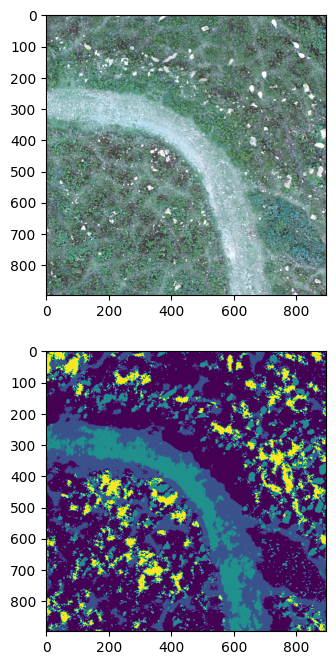

In [6]:
visualize(image, mask)

 ## HorizontalFlip

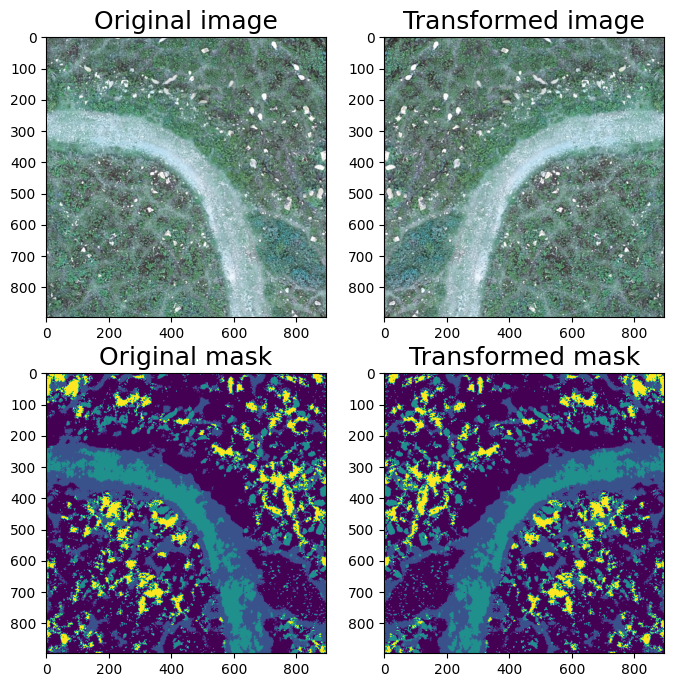

In [7]:
aug = A.HorizontalFlip(p=1)

augmented = aug(image=image, mask=mask)

image_h_flipped = augmented['image']
mask_h_flipped = augmented['mask']

visualize(image_h_flipped, mask_h_flipped, original_image=image, original_mask=mask)

## VerticalFlip

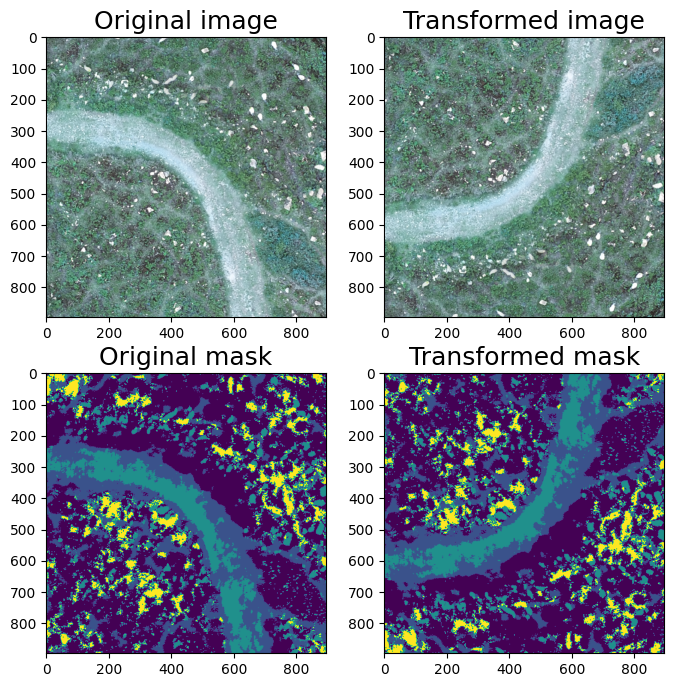

In [8]:
aug = A.VerticalFlip(p=1)

augmented = aug(image=image, mask=mask)

image_v_flipped = augmented['image']
mask_v_flipped = augmented['mask']

visualize(image_v_flipped, mask_v_flipped, original_image=image, original_mask=mask)

 ## Transpose (switch X and Y axis) 

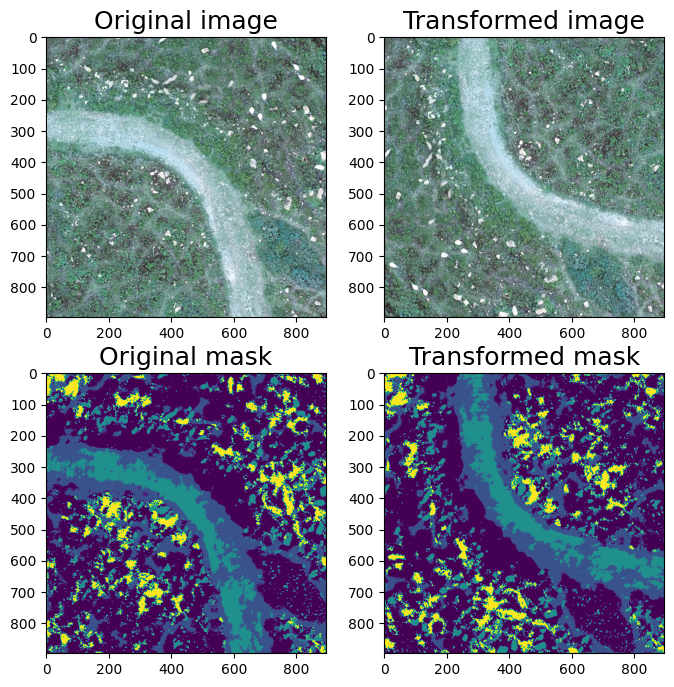

In [9]:
aug = A.Transpose(p=1)

augmented = aug(image=image, mask=mask)

image_transposed = augmented['image']
mask_transposed = augmented['mask']

visualize(image_transposed, mask_transposed, original_image=image, original_mask=mask)

## Rotation


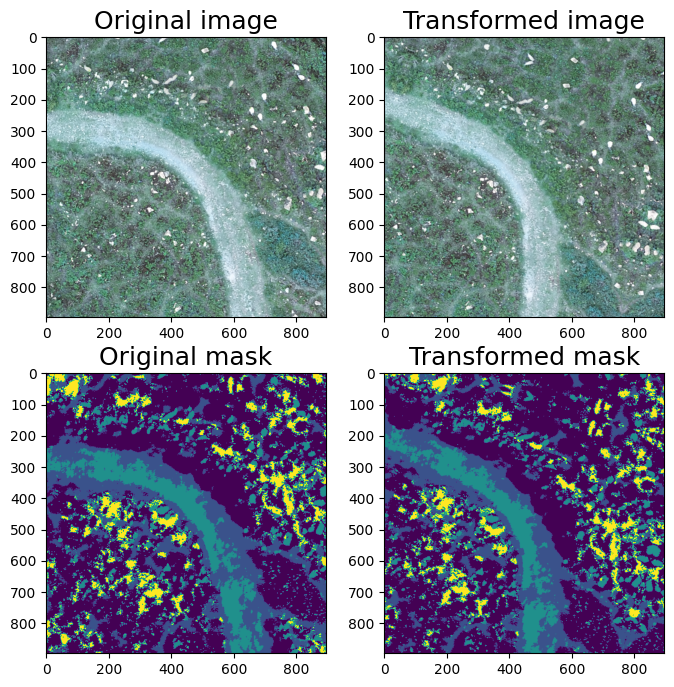

In [10]:
aug =A.ShiftScaleRotate( rotate_limit=33,p=1)

augmented = aug(image=image, mask=mask)

image_rot90 = augmented['image']
mask_rot90 = augmented['mask']

visualize(image_rot90, mask_rot90, original_image=image, original_mask=mask)

## RandomSizedCrop

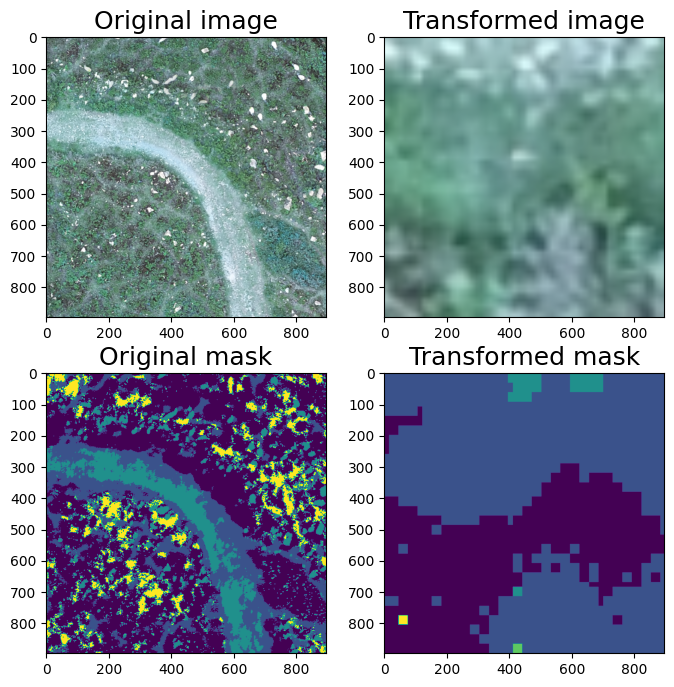

In [11]:
aug = A.RandomSizedCrop(min_max_height=(50, 101), height=original_height, width=original_width, p=1)

random.seed(7)
augmented = aug(image=image, mask=mask)

image_scaled = augmented['image']
mask_scaled = augmented['mask']

visualize(image_scaled, mask_scaled, original_image=image, original_mask=mask)

# Let's try to combine different transformations

Light non-destructive augmentations.

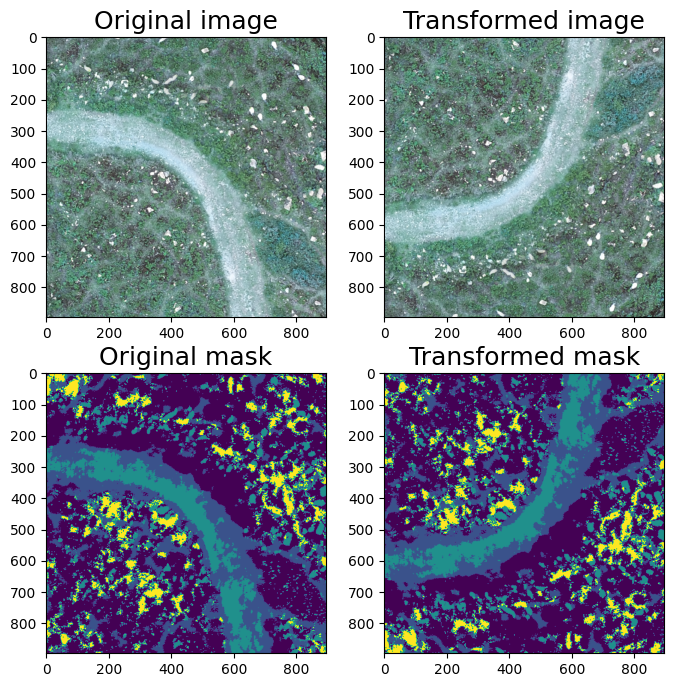

In [12]:
aug = A.Compose([
    A.VerticalFlip(p=0.5),              
    A.RandomRotate90(p=0.5)]
)

random.seed(7)
augmented = aug(image=image, mask=mask)

image_light = augmented['image']
mask_light = augmented['mask']

visualize(image_light, mask_light, original_image=image, original_mask=mask)

# EXAMPLE OF AERIAL IMAGE AUGMENTATION

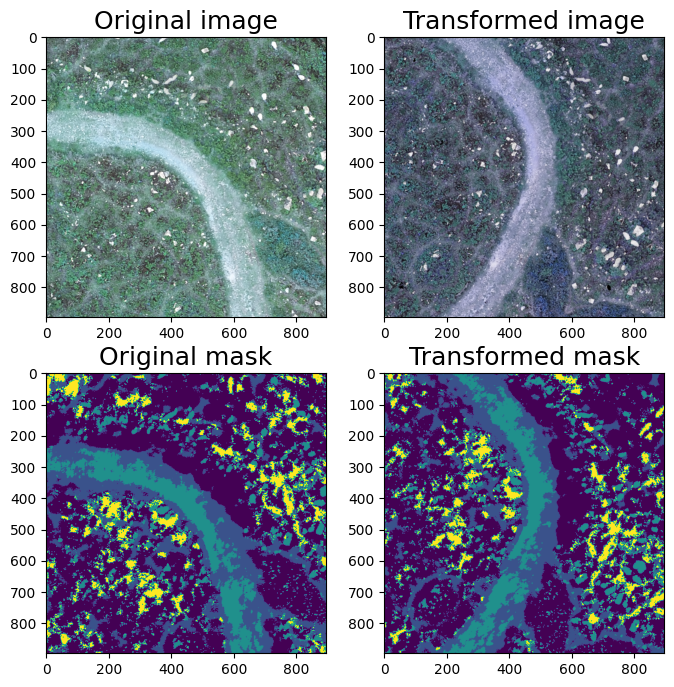

In [14]:
#interesante, creamos una imagen completamente nueva con distinto color
aug = A.Compose([
     #A.RandomSizedCrop((512-100, 512+100), 512, 512),
     A.ShiftScaleRotate(),
     A.RGBShift(),
     #A.Blur(),
     #A.GaussNoise(),
     #A.ElasticTransform(),
     A.MaskDropout((10,15), p=1),
     #A.Cutout(p=1),
     A.HueSaturationValue(p=0.3)
],p=1)
random.seed(7)
augmented = aug(image=image, mask=mask)

image_light = augmented['image']
mask_light = augmented['mask']

visualize(image_light, mask_light, original_image=image, original_mask=mask)

# COMBINED COLOR TECHNIQUES

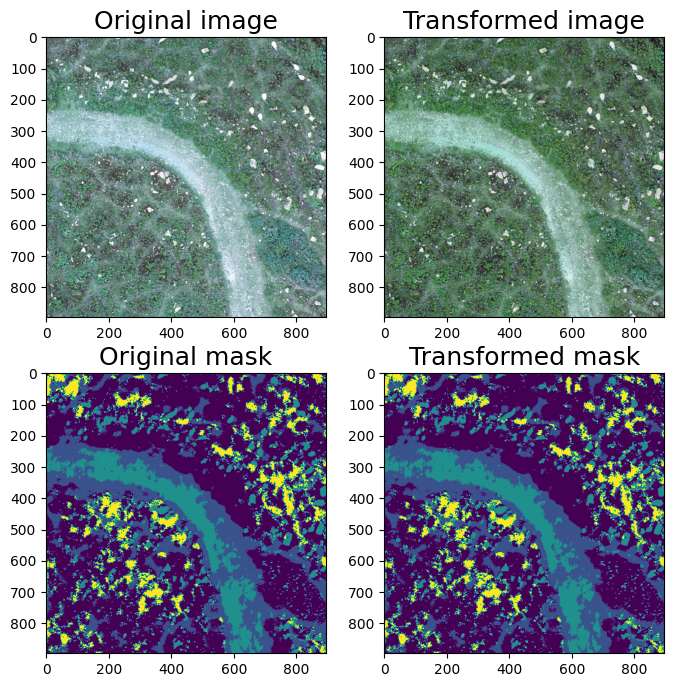

In [15]:
aug = A.HueSaturationValue(p=1)
random.seed(7)
augmented = aug(image=image, mask=mask)

image_light = augmented['image']
mask_light = augmented['mask']

visualize(image_light, mask_light, original_image=image, original_mask=mask)

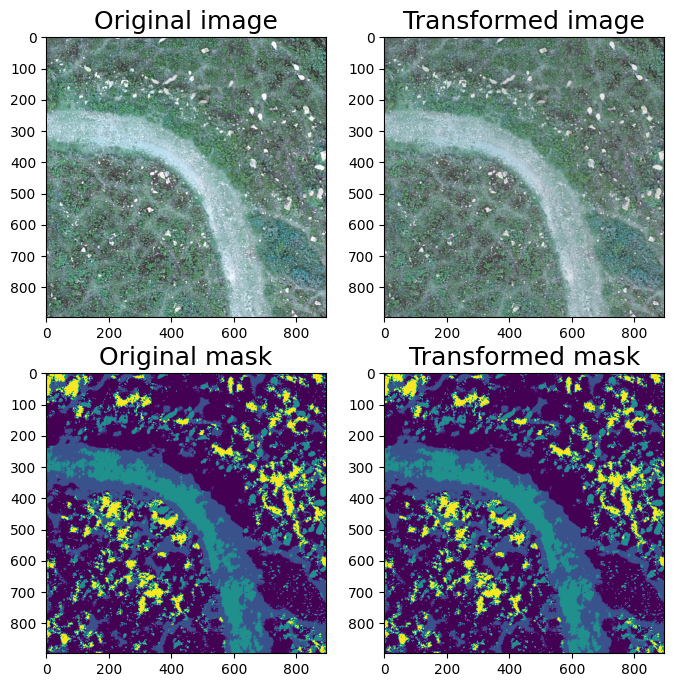

In [16]:
aug = A.RandomBrightnessContrast()
random.seed(7)
augmented = aug(image=image, mask=mask)

image_light = augmented['image']
mask_light = augmented['mask']

visualize(image_light, mask_light, original_image=image, original_mask=mask)

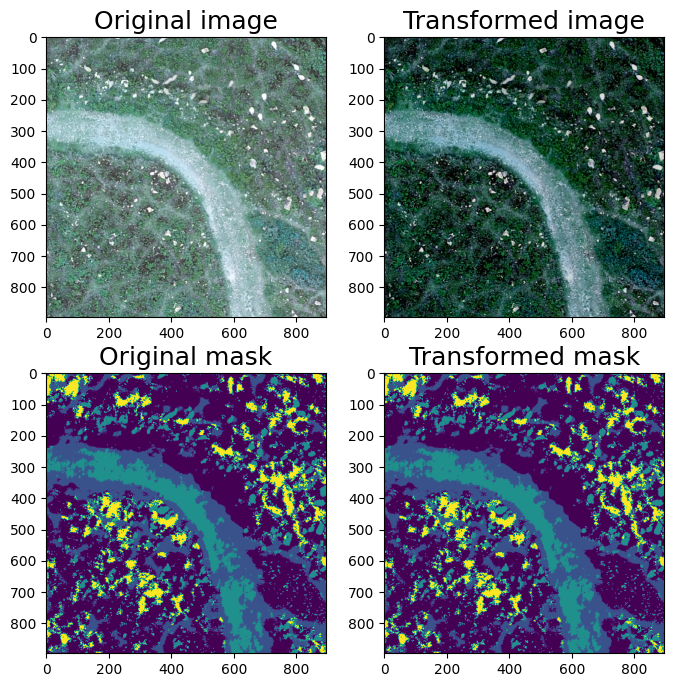

In [17]:
aug = A.Compose([ A.RandomBrightnessContrast(brightness_limit=0.5, contrast_limit=1, p=1.0),])
random.seed(7)
augmented = aug(image=image, mask=mask)

image_light = augmented['image']
mask_light = augmented['mask']

visualize(image_light, mask_light, original_image=image, original_mask=mask)     

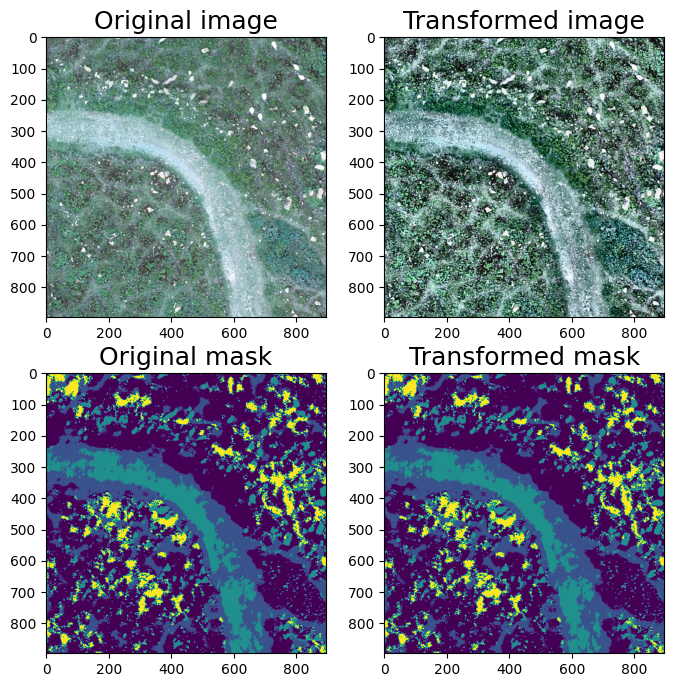

In [18]:
aug = A.Compose([
    A.RandomBrightnessContrast(p=1),    
    A.RandomGamma(p=1),    
    A.CLAHE(p=1),    
], p=1)
random.seed(7)
augmented = aug(image=image, mask=mask)

image_light = augmented['image']
mask_light = augmented['mask']

visualize(image_light, mask_light, original_image=image, original_mask=mask)  

# Color Tenchniques

## GAMMA

C:\Users\sergi\AppData\Local\Temp\ipykernel_32480\469927569.py:1: UserWarning: Argument 'eps' is not valid and will be ignored.
  aug = A.RandomGamma(gamma_limit=(30, 250), eps=None, always_apply=True, p=1)


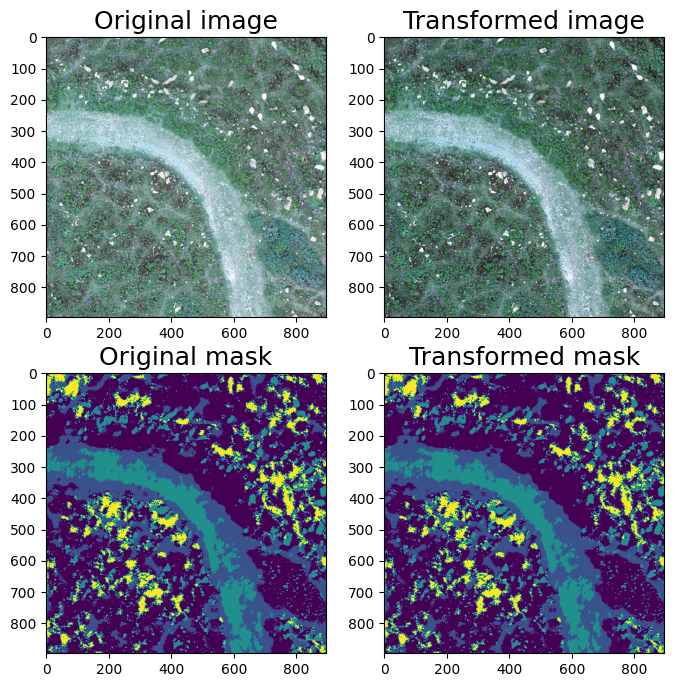

In [19]:
aug = A.RandomGamma(gamma_limit=(30, 250), eps=None, always_apply=True, p=1)
augmented = aug(image=image, mask=mask)

image_v_flipped = augmented['image']
mask_v_flipped = augmented['mask']

visualize(image_v_flipped, mask_v_flipped, original_image=image, original_mask=mask)

## BRIGHTNESS

In [20]:
aug=  A.RandomBrightness(limit=0.4, always_apply=True, p=1)
#Randomly change brightness of the input image. from [-limit to limit]
augmented = aug(image=image, mask=mask)

image_v_flipped = augmented['image']
mask_v_flipped = augmented['mask']

visualize(image_v_flipped, mask_v_flipped, original_image=image, original_mask=mask)

AttributeError: module 'albumentations' has no attribute 'RandomBrightness'

## Contrast

In [21]:
aug=  A.RandomContrast (limit=0.4, always_apply=True, p=1)
#Randomly change contrast of the input image. from [-limit to limit]
augmented = aug(image=image, mask=mask)

image_contrast = augmented['image']
mask_contrast = augmented['mask']

visualize(image_contrast, mask_contrast, original_image=image, original_mask=mask)

AttributeError: module 'albumentations' has no attribute 'RandomContrast'

## CLAHE

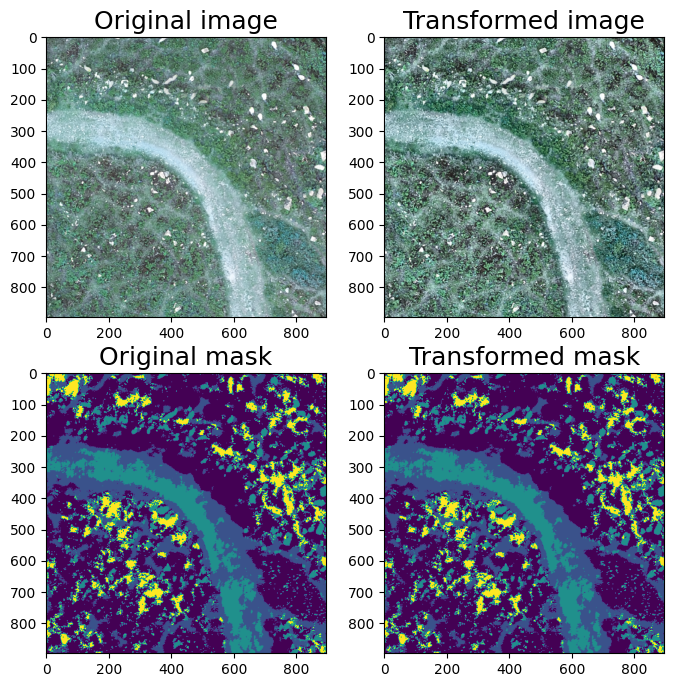

In [22]:
aug=A.CLAHE (clip_limit=4.0, tile_grid_size=(8, 8), always_apply=False, p=1)
#Apply Contrast Limited Adaptive Histogram Equalization to the input image.
augmented = aug(image=image, mask=mask)

image_clahe = augmented['image']
mask_clahe = augmented['mask']

visualize(image_clahe, mask_clahe, original_image=image, original_mask=mask)

# Create our singles dataAUG techniques dataset

In [25]:
import os
data_original = "D:/CIFA/huevos_fritos/procesados/imgs"
files = os.listdir(data_original)
imgs = []
masks = []
for file in files:
    file = os.path.splitext(file)[0] 
    if "label" in file:
        masks.append(file)
    else:
        imgs.append(file)


In [26]:
imgs

['DJI_202303151128_06_14',
 'DJI_202303151128_07_11',
 'DJI_202303151128_07_14',
 'DJI_202303151128_08_13',
 'DJI_202303151128_10_20',
 'DJI_202303151128_11_18',
 'DJI_202303151128_11_21',
 'DJI_202303151128_12_13',
 'DJI_202303151128_12_21',
 'DJI_202303151128_mezcla',
 'DJI_202303151128_nocambios',
 'DJI_202303151128_total',
 'DJI_202305051131_06_14',
 'DJI_202305051131_07_11',
 'DJI_202305051131_07_14',
 'DJI_202305051131_08_13',
 'DJI_202305051131_10_20',
 'DJI_202305051131_11_18',
 'DJI_202305051131_11_21',
 'DJI_202305051131_12_13',
 'DJI_202305051131_12_21',
 'DJI_202305051131_mezcla',
 'DJI_202305051131_nocambios',
 'DJI_202305051131_total',
 'DJI_202306081113_06_14',
 'DJI_202306081113_07_11',
 'DJI_202306081113_07_14',
 'DJI_202306081113_08_13',
 'DJI_202306081113_10_20',
 'DJI_202306081113_11_18',
 'DJI_202306081113_11_21',
 'DJI_202306081113_12_13',
 'DJI_202306081113_12_21',
 'DJI_202306081113_mezcla',
 'DJI_202306081113_nocambios',
 'DJI_202306081113_total',
 'DJI_2023083

In [34]:
# Calcular el índice correspondiente al 80% del tamaño de la lista
indice_75 = int(len(imgs) * 0.75)

# Obtener el 75% de la lista
train = imgs[:indice_75]

# (Opcional) Obtener el 25% restante de la lista
val = imgs[indice_75:]

In [35]:
#seleccion del dataset a aumentar
select = "train"
if select =="train":
    dataset = train
else:
    dataset = val

## Dataset  flipping

In [36]:
import cv2
import os

#creo la nueva carpeta con el nombre del dataset
directorio = f"D:/CIFA/huevos_fritos/procesados/dataAUG/{select}/"

try:
  os.stat(directorio)
except:
  os.mkdir(directorio)

directorio_img = directorio+"imgs/"

try:
  os.stat(directorio_img)
except:
  os.mkdir(directorio_img)

directorio_masks = directorio+"masks/"

try:
  os.stat(directorio_masks)
except:
  os.mkdir(directorio_masks)

for i in range(len(dataset)):
    img = dataset [i]
    #mask = masks [i]
    
    image= cv2.imread('D:/CIFA/huevos_fritos/procesados/original/imgs/' + img + ".tif")
    mask_image = cv2.imread('D:/CIFA/huevos_fritos/procesados/original/masks/' + img + ".tif")
    
    #flip horizontal
    aug = A.HorizontalFlip(p=1)
    augmented = aug(image=image, mask=mask_image)
    image_h_flipped = augmented['image']
    mask_h_flipped = augmented['mask']
    
    #flip vertical
    aug = A.VerticalFlip(p=1)
    augmented = aug(image=image, mask=mask_image)
    image_v_flipped = augmented['image']
    mask_v_flipped = augmented['mask']
    print(img)

    #guardo tanto las imagenes como las mascaras
    #1ºguardo las originales
    cv2.imwrite(directorio_img + img+'.tif',  image)
    cv2.imwrite(directorio_masks + img+'.tif',  cv2.cvtColor(mask_image, cv2.COLOR_BGR2GRAY))
    
    #Guardo las transformaciones
    cv2.imwrite(directorio_img + "h_"+img+'.tif',  image_h_flipped)
    cv2.imwrite(directorio_masks + "h_"+img+'.tif',  cv2.cvtColor(mask_h_flipped, cv2.COLOR_BGR2GRAY))
    cv2.imwrite(directorio_img +  "v_"+img+'.tif',  image_v_flipped)
    cv2.imwrite(directorio_masks + "v_"+img+'.tif',  cv2.cvtColor(mask_v_flipped, cv2.COLOR_BGR2GRAY))
print("Done")

AttributeError: 'NoneType' object has no attribute 'shape'

## Dataset2: Rotation

In [29]:
import cv2

for i in range(len(dataset)):
    img = dataset [i]
    
    image= cv2.imread('D:/CIFA/huevos_fritos/procesados/original/imgs/' + img + ".tif")
    mask_image = cv2.imread('D:/CIFA/huevos_fritos/procesados/original/masks/' + img + ".tif")
    
    aug =A.ShiftScaleRotate( rotate_limit=90,p=1)

    augmented = aug(image=image, mask=mask_image)

    image_rot = augmented['image']
    mask_rot = augmented['mask']
    

    #guardo tanto las imagenes como las mascaras
    #1ºguardo las originales
    cv2.imwrite(directorio_img + img+'.tif',  image)
    cv2.imwrite(directorio_masks + img+'.tif',  cv2.cvtColor(mask_image, cv2.COLOR_BGR2GRAY))
    
    #Guardo las transformaciones
    cv2.imwrite(directorio_img + "rot_"+img+'.tif',  image_rot)
    cv2.imwrite(directorio_masks + "rot_"+img+'.tif',  cv2.cvtColor(mask_rot, cv2.COLOR_BGR2GRAY))
   
print("Done")

Done


## Transpose(Switch X and Y)

In [30]:
import cv2

for i in range(len(dataset)):
    img = dataset [i]
      
    image= cv2.imread('D:/CIFA/huevos_fritos/procesados/original/imgs/' + img + ".tif")
    mask_image = cv2.imread('D:/CIFA/huevos_fritos/procesados/original/masks/' + img + ".tif")
    
    
    aug = A.Transpose(p=1)
    augmented = aug(image=image, mask=mask_image)

    image_transposed = augmented['image']
    mask_transposed = augmented['mask']
    

    #guardo tanto las imagenes como las mascaras
    #1ºguardo las originales
    cv2.imwrite(directorio_img + img + '.tif',  image)
    cv2.imwrite(directorio_masks + img+'.tif',  cv2.cvtColor(mask_image, cv2.COLOR_BGR2GRAY))
    
    #Guardo las transformaciones
    cv2.imwrite(directorio_img + "trans_"+img+'.tif',  image_transposed)
    cv2.imwrite(directorio_masks + "trans_"+img+'.tif',  cv2.cvtColor(mask_transposed, cv2.COLOR_BGR2GRAY))
   
print("Done")

Done


## Brightness

In [52]:
import cv2

#name new dataset
name_dataset = "dataset4_bright"
#creo la nueva carpeta con el nombre del dataset
directorio = "/home/sergio/mmsegmentation/dataset_articulo1_v2_160323/" + name_dataset + "/"

try:
  os.stat(directorio)
except:
  os.mkdir(directorio)

directorio_img =directorio+"img/"

try:
  os.stat(directorio_img)
except:
  os.mkdir(directorio_img)

directorio_masks=directorio+"masks/"

try:
  os.stat(directorio_masks)
except:
  os.mkdir(directorio_masks)

for i in range(len(imgs)):
    img = imgs [i]
    
    
    image= cv2.imread('/home/sergio/mmsegmentation/dataset_articulo1_v2_160323/Dataset_base/imgs/' + img + ".jpg")
    mask_image = cv2.imread('/home/sergio/mmsegmentation/dataset_articulo1_v2_160323/Dataset_base/masks/' + img + ".png")
    
    
    aug=  A.RandomBrightness(limit=0.5, always_apply=True, p=1)
    #Randomly change brightness of the input image. from [-limit to limit]
    augmented = aug(image=image, mask=mask_image)

    image_bright = augmented['image']
    mask_bright = augmented['mask']

    #guardo tanto las imagenes como las mascaras
    #1ºguardo las originales
    cv2.imwrite(directorio_img + img+'.jpg',  image)
    cv2.imwrite(directorio_masks + img+'.png',  cv2.cvtColor(mask_image, cv2.COLOR_BGR2GRAY))
    
    #Guardo las transformaciones
    cv2.imwrite(directorio_img+ "bright_"+img+'.jpg',  image_bright)
    cv2.imwrite(directorio_masks + "bright_"+img+'.png',  cv2.cvtColor(mask_bright, cv2.COLOR_BGR2GRAY))
   
print("Done")

Done


## Contrast

In [53]:
import cv2

#name new dataset
name_dataset = "dataset5_contrast"
#creo la nueva carpeta con el nombre del dataset
directorio = "/home/sergio/mmsegmentation/dataset_articulo1_v2_160323/" + name_dataset + "/"

try:
  os.stat(directorio)
except:
  os.mkdir(directorio)

directorio_img =directorio+"img/"

try:
  os.stat(directorio_img)
except:
  os.mkdir(directorio_img)

directorio_masks=directorio+"masks/"

try:
  os.stat(directorio_masks)
except:
  os.mkdir(directorio_masks)

for i in range(len(imgs)):
    img = imgs [i]
    
    
    image= cv2.imread('/home/sergio/mmsegmentation/dataset_articulo1_v2_160323/Dataset_base/imgs/' + img + ".jpg")
    mask_image = cv2.imread('/home/sergio/mmsegmentation/dataset_articulo1_v2_160323/Dataset_base/masks/' + img + ".png")
    
    
    aug=  A.RandomContrast (limit=0.4, always_apply=True, p=1)
    #Randomly change contrast of the input image. from [-limit to limit]
    augmented = aug(image=image, mask=mask_image)

    image_contrast = augmented['image']
    mask_contrast = augmented['mask']


    #guardo tanto las imagenes como las mascaras
    #1ºguardo las originales
    cv2.imwrite(directorio_img + img +'.jpg',  image)
    cv2.imwrite(directorio_masks + img+'.png',  cv2.cvtColor(mask_image, cv2.COLOR_BGR2GRAY))
    
    #Guardo las transformaciones
    cv2.imwrite(directorio_img + "contrast_"+ img +'.jpg',  image_contrast)
    cv2.imwrite(directorio_masks + "contrast_"+ img +'.png',  cv2.cvtColor(mask_contrast, cv2.COLOR_BGR2GRAY))
   
print("Done")

Done


## CLAHE

In [54]:
import cv2

#name new dataset
name_dataset = "dataset6_clahe"
#creo la nueva carpeta con el nombre del dataset
directorio = "/home/sergio/mmsegmentation/dataset_articulo1_v2_160323/VAL_clahe/imgs_original/"

try:
  os.stat(directorio)
except:
  os.mkdir(directorio)

directorio_img =directorio+"img/"

try:
  os.stat(directorio_img)
except:
  os.mkdir(directorio_img)

directorio_masks=directorio+"masks/"

try:
  os.stat(directorio_masks)
except:
  os.mkdir(directorio_masks)

for i in range(len(imgs)):
    img = imgs [i]
    
    print(img)
    image= cv2.imread('/home/sergio/mmsegmentation/dataset_articulo1_v2_160323/Dataset_base/imgs/' + img + ".jpg")
    mask_image = cv2.imread('/home/sergio/mmsegmentation/dataset_articulo1_v2_160323/Dataset_base/masks/' + img + ".png")
    
    
    aug=A.CLAHE (clip_limit=4.0, tile_grid_size=(8, 8), always_apply=True, p=1)
    #Apply Contrast Limited Adaptive Histogram Equalization to the input image.
    augmented = aug(image=image, mask=mask_image)

    image_clahe = augmented['image']
    mask_clahe = augmented['mask']

    #guardo tanto las imagenes como las mascaras
    #1ºguardo las originales
    cv2.imwrite(directorio_img + img+'.jpg',  image)
    cv2.imwrite(directorio_masks + img+'.png',  cv2.cvtColor(mask_image, cv2.COLOR_BGR2GRAY))
    
    #Guardo las transformaciones
    cv2.imwrite(directorio_img + "clahe_"+img+'.jpg',  image_clahe)
    cv2.imwrite(directorio_masks + "clahe_"+img+'.png',  cv2.cvtColor(mask_clahe, cv2.COLOR_BGR2GRAY))
   
print("Done")

PNOA_2017_clip_022_061
PNOA_2020_clip_047_055
PNOA_2014_clip_037_145
PNOA_2017_clip_088_078
PNOA_2014_clip_103_093
PNOA_2014_clip_084_097
PNOA_2014_clip_096_106
PNOA_2017_clip_057_063
PNOA_2020_clip_045_040
PNOA_2020_clip_103_093
PNOA_2020_clip_096_106
PNOA_2020_clip_087_138
PNOA_2014_clip_047_055
PNOA_2017_clip_008_066
PNOA_2014_clip_087_138
PNOA_2020_clip_108_080
PNOA_2014_clip_047_055
PNOA_2017_clip_022_061
PNOA_2014_clip_027_084
PNOA_2014_clip_107_088
PNOA_2014_clip_045_040
PNOA_2017_clip_037_145
PNOA_2017_clip_041_030
PNOA_2017_clip_027_084
PNOA_2017_clip_016_042
PNOA_2017_clip_108_080
PNOA_2017_clip_004_036
PNOA_2017_clip_087_138
PNOA_2020_clip_051_059
PNOA_2020_clip_041_030
PNOA_2017_clip_037_145
PNOA_2014_clip_016_042
PNOA_2017_clip_084_097
PNOA_2020_clip_016_042
PNOA_2014_clip_040_052
PNOA_2017_clip_040_052
PNOA_2017_clip_088_078
PNOA_2017_clip_087_138
PNOA_2017_clip_047_129
PNOA_2020_clip_041_030
PNOA_2017_clip_096_106
PNOA_2020_clip_108_080
PNOA_2017_clip_008_066
PNOA_2020_c

## Saturation

In [55]:
import cv2

#name new dataset
name_dataset = "dataset7_sat"
#creo la nueva carpeta con el nombre del dataset
directorio = "/home/sergio/mmsegmentation/dataset_articulo1_v2_160323/" + name_dataset + "/"

try:
  os.stat(directorio)
except:
  os.mkdir(directorio)

directorio_img =directorio+"img/"

try:
  os.stat(directorio_img)
except:
  os.mkdir(directorio_img)

directorio_masks=directorio+"masks/"

try:
  os.stat(directorio_masks)
except:
  os.mkdir(directorio_masks)

for i in range(len(imgs)):
    img = imgs [i]
    
    
    image= cv2.imread('/home/sergio/mmsegmentation/dataset_articulo1_v2_160323/Dataset_base/imgs/' + img + ".jpg")
    mask_image = cv2.imread('/home/sergio/mmsegmentation/dataset_articulo1_v2_160323/Dataset_base/masks/' + img + ".png")
    
    
    aug = A.HueSaturationValue(hue_shift_limit=0, sat_shift_limit=30, val_shift_limit=0, always_apply=True, p=1)
    random.seed(7)
    augmented = aug(image=image, mask=mask_image)

    image_sat = augmented['image']
    mask_sat = augmented['mask']

    #guardo tanto las imagenes como las mascaras
    #1ºguardo las originales
    cv2.imwrite(directorio_img + img+'.jpg',  image)
    cv2.imwrite(directorio_masks + img+'.png',  cv2.cvtColor(mask_image, cv2.COLOR_BGR2GRAY))
    
    #Guardo las transformaciones
    cv2.imwrite(directorio_img + "sat_"+img+'.jpg',  image_sat)
    cv2.imwrite(directorio_masks + "sat_"+img+'.png',  mask_sat)
   
print("Done")

Done


## HUE

In [56]:
import cv2

#name new dataset
name_dataset = "dataset8_HUE"
#creo la nueva carpeta con el nombre del dataset
directorio = "/home/sergio/mmsegmentation/dataset_articulo1_v2_160323/" + name_dataset + "/"

try:
  os.stat(directorio)
except:
  os.mkdir(directorio)

directorio_img =directorio+"img/"

try:
  os.stat(directorio_img)
except:
  os.mkdir(directorio_img)

directorio_masks=directorio+"masks/"

try:
  os.stat(directorio_masks)
except:
  os.mkdir(directorio_masks)

for i in range(len(imgs)):
    img = imgs [i]
    
    
    image= cv2.imread('/home/sergio/mmsegmentation/dataset_articulo1_v2_160323/Dataset_base/imgs/' + img + ".jpg")
    mask_image = cv2.imread('/home/sergio/mmsegmentation/dataset_articulo1_v2_160323/Dataset_base/masks/' + img + ".png")
    
    
    aug = A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=0, val_shift_limit=0, always_apply=True, p=1)
    random.seed(7)
    augmented = aug(image=image, mask=mask_image)

    image_hue = augmented['image']
    mask_hue = augmented['mask']

    #guardo tanto las imagenes como las mascaras
    #1ºguardo las originales
    cv2.imwrite(directorio_img + img+'.jpg',  image)
    cv2.imwrite(directorio_masks + img+'.png',  cv2.cvtColor(mask_image, cv2.COLOR_BGR2GRAY))
    
    #Guardo las transformaciones
    cv2.imwrite(directorio_img + "hue_"+img+'.jpg',  image_hue)
    cv2.imwrite(directorio_masks + "hue_"+img+'.png',  mask_hue)
   
print("Done")

Done


In [ ]:
cd Pytorch-UNet

In [ ]:
python train.py --amp